# Homework: Principal Components Analysis
#### Computational Linear Algebra for Large Scale Problems
#### Politecnico di Torino
#### A.Y. 2022/2023
Authors:
- Lorenzo Bergadano, <lorenzo.bergadano@studenti.polito.it>
- Giovanni Cadau, <giovanni.cadau@studenti.polito.it>

- [Introduction:](#Introduction:)
- [Exercise 1: Setting the random state and loading the data](#Exercise-1:-Setting-the-random-state-and-loading-the-data)
  * [Exercise 1 section D](#Exercise-1-section-D)
  * [Visualizing the effect of just dropping the null values](#Visualizing-the-effect-of-just-dropping-the-null-values)
  * [Analyzing the dataframe to retain as much information as possible when cleaning it](#Analyzing-the-dataframe-to-retain-as-much-information-as-possible-when-cleaning-it)
  * [Analyzing the variances](#Analyzing-the-variances)
  * [Assessing null values across rows](#Assessing-null-values-across-rows)
- [Exercise 2: Encoding of Categorical Data](#Exercise-2:-Encoding-of-Categorical-Data)
- [Exercise 3: Preprocessing and PCA](#Exercise-3:-Preprocessing-and-PCA)
  * [Applying the PCA](#Applying-the-PCA)
- [Exercise 4: Dimensionality reduction and interpretation of the PCs](#Exercise-4:-Dimensionality-reduction-and-interpretation-of-the-PCs)
- [Exercise 5 and 6: k-Means and Clusters and centroid interpretation and visualization](#Exercise-5-and-6:-k-Means-and-Clusters-and-centroid-interpretation-and-visualization)
- [Exercise 7: Clusters and centroids evaluation](#Exercise-7:-Clusters-and-centroids-evaluation)
- [Conclusions](#Conclusions)

## Introduction:

This Jupiter Notebook is dedicated to the comprehensive analysis of a motorcycle dataset extracted from bikez.com. The dataset provided for this task describes a wide range of motorcycles through various technical features, such as brand, year, category, power, torque, and many more. It consists of 12.266 rows and 27 columns encapsulating both numeric and categorical data and their respective missing values.

The objective of this analysis is twofold. Firstly, we aim to summarise the available data, reducing the dimensionality of the dataset while preserving at least 35% of the information. This will later require the use of Principal Component Analysis (PCA), a statistical technique for reducing the dimensionality of a dataset.

Secondly, we aim to identify "motorcycle profiles" based on the summarised features. Specifically, we will use the k-Means algorithm to identify a minimum of 3 up to 10 profiles.
This exercise aims to simulate a real-world scenario where a company seeks to analyse the market and identify meaningful profiles of products to aid future decision-making.

In [1]:
import random

import numpy as np
import pandas as pd
import seaborn as sns

from matplotlib import pyplot as plt
import matplotlib.patheffects as pe
%matplotlib inline

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.impute import KNNImputer

In [2]:
input_file = 'cla4lsp22_bikez_curated.csv' # csv file storing the database to be used

## Exercise 1: Setting the random state and loading the data
In this section, we are preparing the motorcycle dataset for analysis. We start by loading the data and creating a working subset based on a random selection criterion to then separate the dataset into 'labels' and 'features' for easier manipulation and analysis.

Next, we randomly select and drop certain feature columns to simulate real-world scenarios where not all data may be available or relevant. This process also helps to reduce the dimensionality of the dataset.

Finally, we visually inspect the resulting dataframes to ensure that the data manipulation steps have been correctly applied.

In [3]:
def set_randomState(id1, id2):
    rs = min(id1, id2) # compute the lower ID student number
    return rs

In [4]:
# Initialization of the random state

bergadano_id = 304415
cadau_id = 304861
rs = set_randomState(bergadano_id, cadau_id)

In [5]:
# Store in a Pandas DataFrame the content of the input file
df_tot = pd.read_csv(input_file)

# Set the numpy random seed as the random state rs
random.seed(rs)
r_int = random.randint(0, 2)  # select a random integer r among: [0, 1, 2]
workdf = df_tot[df_tot["Year"] % 3 == r_int]  # create a sub-DFs workdf containing only data corresponding to years with reminder r, if divided by three

In [6]:
# Print some rows and columns of the dataframe to visualize the structure of the dataset
display(workdf)

,Brand,Model,Year,Category,Rating,Displacement (ccm),Power (hp),Torque (Nm),Engine cylinder,Engine stroke,...,Dry weight (kg),Wheelbase (mm),Seat height (mm),Fuel system,Front brakes,Rear brakes,Front tire,Rear tire,Front suspension,Rear suspension
1,acabion,gtbo 55,2007,Sport,2.6,1300.0,541.0,420.0,In-line four,four-stroke,...,360.0,NaN,NaN,other,not given/unknown,not given/unknown,other,other,not given/unknown,not given/unknown
4,acabion,gtbo 70,2007,Prototype / concept model,3.1,1300.0,689.0,490.0,In-line four,four-stroke,...,300.0,NaN,NaN,other,not given/unknown,not given/unknown,other,other,not given/unknown,not given/unknown
6,access,ams 3.20 supercross,2016,ATV,NaN,280.0,18.8,NaN,Single cylinder,four-stroke,...,225.0,NaN,NaN,carburettor,single disc,single disc,other,other,not given/unknown,not given/unknown
7,access,ams 4.30 supermoto efi,2016,ATV,NaN,359.3,29.5,NaN,Single cylinder,four-stroke,...,236.0,NaN,NaN,efi. injection,single disc,single disc,other,other,not given/unknown,not given/unknown
8,access,ams 4.38 sm gear shift,2016,ATV,NaN,449.0,37.6,NaN,Single cylinder,four-stroke,...,236.0,NaN,NaN,carburettor,single disc,single disc,other,other,other,not given/unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38459,zündapp,roller super,1968,Scooter,NaN,49.0,NaN,NaN,Single cylinder,two-stroke,...,83.5,NaN,NaN,carburettor. other,expanding brake (drum brake),expanding brake (drum brake),other,other,not given/unknown,not given/unknown
38462,zündapp,z 2 g,1923,Sport,NaN,211.0,2.8,NaN,Single cylinder,two-stroke,...,73.0,NaN,NaN,carburettor,not given/unknown,not given/unknown,other,other,other,other
38466,zündapp,z 22,1923,Sport,NaN,211.0,2.3,NaN,Single cylinder,two-stroke,...,58.0,NaN,NaN,carburettor,not given/unknown,not given/unknown,other,other,other,other
38468,zündapp,z 249,1923,Sport,NaN,249.0,2.8,NaN,Single cylinder,two-stroke,...,76.0,NaN,NaN,carburettor,expanding brake (drum brake),expanding brake (drum brake),other,other,other,other


In [7]:
# Set some variables with column names

labels_name = {'Brand', 'Model', 'Year', 'Category', 'Rating'}
features_name = set(workdf.columns) - labels_name
categorical_features_name = {'Engine cylinder', 'Engine stroke',
                             'Gearbox', 'Fuel control', 'Cooling system', 'Transmission type', 'Fuel system',
                             'Front brakes', 'Rear brakes', 'Front tire', 'Rear tire',
                             'Front suspension', 'Rear suspension'}
numerical_features_name = {'Power (hp)', 'Seat height (mm)', 'Fuel capacity (lts)',
                            'Dry weight (kg)', 'Bore (mm)', 'Wheelbase (mm)', 'Stroke (mm)',
                            'Torque (Nm)', 'Displacement (ccm)'}

In [8]:
# Exctract from the DataFrame labels and features

labels = workdf.loc[:, list(labels_name)]
features = workdf.loc[:, list(features_name)]

In [9]:
# Print some rows and columns of the labels dataframe to visualize the structure of the dataset
display(labels)

,Model,Year,Rating,Category,Brand
1,gtbo 55,2007,2.6,Sport,acabion
4,gtbo 70,2007,3.1,Prototype / concept model,acabion
6,ams 3.20 supercross,2016,NaN,ATV,access
7,ams 4.30 supermoto efi,2016,NaN,ATV,access
8,ams 4.38 sm gear shift,2016,NaN,ATV,access
...,...,...,...,...,...
38459,roller super,1968,NaN,Scooter,zündapp
38462,z 2 g,1923,NaN,Sport,zündapp
38466,z 22,1923,NaN,Sport,zündapp
38468,z 249,1923,NaN,Sport,zündapp


In [10]:
# Print some rows and columns of the features dataframe to visualize the structure of the dataset
display(features)

,Torque (Nm),Cooling system,Rear brakes,Front brakes,Dry weight (kg),Fuel control,Transmission type,Engine stroke,Stroke (mm),Displacement (ccm),...,Front suspension,Gearbox,Rear suspension,Fuel system,Seat height (mm),Front tire,Rear tire,Fuel capacity (lts),Engine cylinder,Bore (mm)
1,420.0,Liquid,not given/unknown,not given/unknown,360.0,Not Given/Unknown,Not Given/Unknown,four-stroke,63.0,1300.0,...,not given/unknown,6-speed,not given/unknown,other,NaN,other,other,NaN,In-line four,81.0
4,490.0,Liquid,not given/unknown,not given/unknown,300.0,Not Given/Unknown,Not Given/Unknown,four-stroke,63.0,1300.0,...,not given/unknown,6-speed,not given/unknown,other,NaN,other,other,NaN,In-line four,81.0
6,NaN,Air,single disc,single disc,225.0,Overhead Valves (OHV),Chain,four-stroke,NaN,280.0,...,not given/unknown,Automatic,not given/unknown,carburettor,NaN,other,other,14.0,Single cylinder,NaN
7,NaN,Air,single disc,single disc,236.0,Overhead Cams (OHC),Chain,four-stroke,NaN,359.3,...,not given/unknown,Automatic,not given/unknown,efi. injection,NaN,other,other,14.0,Single cylinder,NaN
8,NaN,Air,single disc,single disc,236.0,Overhead Cams (OHC),Chain,four-stroke,NaN,449.0,...,other,5-speed,not given/unknown,carburettor,NaN,other,other,14.0,Single cylinder,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38459,NaN,Air,expanding brake (drum brake),expanding brake (drum brake),83.5,Not Given/Unknown,Not Given/Unknown,two-stroke,42.0,49.0,...,not given/unknown,Not Given/Unknown,not given/unknown,carburettor. other,NaN,other,other,NaN,Single cylinder,39.0
38462,NaN,Air,not given/unknown,not given/unknown,73.0,Not Given/Unknown,Belt,two-stroke,70.0,211.0,...,other,2-speed,other,carburettor,NaN,other,other,6.0,Single cylinder,62.0
38466,NaN,Air,not given/unknown,not given/unknown,58.0,Not Given/Unknown,Belt,two-stroke,70.0,211.0,...,other,Not Given/Unknown,other,carburettor,NaN,other,other,6.0,Single cylinder,62.0
38468,NaN,Air,expanding brake (drum brake),expanding brake (drum brake),76.0,Not Given/Unknown,Belt,two-stroke,82.5,249.0,...,other,3-speed,other,carburettor,NaN,other,other,6.1,Single cylinder,68.0


In [11]:
# Select the columns to drop at random among three possible sets of two columns

first_set_of_features = ["Front brakes", "Rear brakes"]
second_set_of_features = ["Front tire", "Rear tire"]
third_set_of_features = ["Front suspension", "Rear suspension"]
features_to_drop = [first_set_of_features, second_set_of_features, third_set_of_features]

# Set the numpy random seed as the random state rs
random.seed(rs)
columns_to_drop = features_to_drop[random.randint(0, 2)]

# Drop the columns from the dataframe
print(f"The columns: {columns_to_drop} were randomly dropped.")

workdf = workdf.drop(columns_to_drop, axis=1)

categorical_features_name = categorical_features_name - set(columns_to_drop)
features_name = features_name - set(columns_to_drop)

The columns: ['Front brakes', 'Rear brakes'] were randomly dropped.


In [12]:
# Print some rows and columns of the resulting dataframe to visualize the structure of the dataset

display(workdf)

,Brand,Model,Year,Category,Rating,Displacement (ccm),Power (hp),Torque (Nm),Engine cylinder,Engine stroke,...,Cooling system,Transmission type,Dry weight (kg),Wheelbase (mm),Seat height (mm),Fuel system,Front tire,Rear tire,Front suspension,Rear suspension
1,acabion,gtbo 55,2007,Sport,2.6,1300.0,541.0,420.0,In-line four,four-stroke,...,Liquid,Not Given/Unknown,360.0,NaN,NaN,other,other,other,not given/unknown,not given/unknown
4,acabion,gtbo 70,2007,Prototype / concept model,3.1,1300.0,689.0,490.0,In-line four,four-stroke,...,Liquid,Not Given/Unknown,300.0,NaN,NaN,other,other,other,not given/unknown,not given/unknown
6,access,ams 3.20 supercross,2016,ATV,NaN,280.0,18.8,NaN,Single cylinder,four-stroke,...,Air,Chain,225.0,NaN,NaN,carburettor,other,other,not given/unknown,not given/unknown
7,access,ams 4.30 supermoto efi,2016,ATV,NaN,359.3,29.5,NaN,Single cylinder,four-stroke,...,Air,Chain,236.0,NaN,NaN,efi. injection,other,other,not given/unknown,not given/unknown
8,access,ams 4.38 sm gear shift,2016,ATV,NaN,449.0,37.6,NaN,Single cylinder,four-stroke,...,Air,Chain,236.0,NaN,NaN,carburettor,other,other,other,not given/unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38459,zündapp,roller super,1968,Scooter,NaN,49.0,NaN,NaN,Single cylinder,two-stroke,...,Air,Not Given/Unknown,83.5,NaN,NaN,carburettor. other,other,other,not given/unknown,not given/unknown
38462,zündapp,z 2 g,1923,Sport,NaN,211.0,2.8,NaN,Single cylinder,two-stroke,...,Air,Belt,73.0,NaN,NaN,carburettor,other,other,other,other
38466,zündapp,z 22,1923,Sport,NaN,211.0,2.3,NaN,Single cylinder,two-stroke,...,Air,Belt,58.0,NaN,NaN,carburettor,other,other,other,other
38468,zündapp,z 249,1923,Sport,NaN,249.0,2.8,NaN,Single cylinder,two-stroke,...,Air,Belt,76.0,NaN,NaN,carburettor,other,other,other,other


## Exercise 1 section D

In this section, we are addressing the issue of missing values in our motorcycle dataset.
First, we start by calculating the percentage of missing values in each column and row to understand the extent of missing data and identify any inconsistencies.

Next, we proceed to replace certain values in the 'Front suspension' column that represent the same category but are worded differently to keep uor data consistent.

We also calculate the variance of the numerical features in our dataset to have an idea of how much the values in a feature vary to understand the spread and diversity of our data.

Finally, we decide to drop rows with more than four missing values, as these rows lack sufficient information for a reliable analysis. We then impute the remaining missing values in our dataset, using a mean strategy for numerical columns and the most frequent strategy for categorical columns. This approach allows us to retain as much data as possible while dealing with missing values in a sensible manner.

### Visualizing the effect of just dropping the null values
We will now try to drop all null values in the dataframe:

In [13]:
print("Dropping null values evaluation.")
print(f"\tNumber of rows in the DataFrame before dropping null values: {len(workdf)}")
workdf_droppedNullValues = workdf.loc[:, list(features_name)].dropna()
print(f"\tNumber of rows in the DataFrame after dropping null values: {len(workdf_droppedNullValues)}")
print(f"Percentage of dropped rows: {(len(workdf)-len(workdf_droppedNullValues)) / len(workdf) * 100:.2f}%")

Dropping null values evaluation.
	Number of rows in the DataFrame before dropping null values: 13673
	Number of rows in the DataFrame after dropping null values: 2042
Percentage of dropped rows: 85.07%


Before cleaning the data by removing null values, the dataframe 'workdf' has a length of 12533, meaning it contains 12533 data entries or rows.

If all rows containing at least one null value where to be dropped, the length of the dataframe would reduce to 1860.
This drastic reduction would mean the loss of a significant amount of information and would likely lead to a significant loss in the meaningfulness and reliability of any subsequent analysis, as a large proportion of the original information is not being considered.

### Assessing null values across rows and columns
The following code sections aims to analyze the distribution of null values across rows in the dataframe to gain insights into the completeness of our data.
Having an understanding of where null values occur will allow us to better handle missing data.

#### Assessing null by column

In [14]:
print("Percentage of missing values by column.")
percs = (workdf.loc[:, list(features_name)].isnull().mean() * 100).sort_values(ascending=False)
for c, p in percs.items():
    print(f"\t{c}: {p:.2f}%")

Percentage of missing values by column.
	Torque (Nm): 56.55%
	Dry weight (kg): 41.91%
	Seat height (mm): 36.99%
	Wheelbase (mm): 33.01%
	Power (hp): 32.58%
	Stroke (mm): 24.63%
	Bore (mm): 24.63%
	Fuel capacity (lts): 18.89%
	Displacement (ccm): 2.48%
	Engine stroke: 0.00%
	Transmission type: 0.00%
	Cooling system: 0.00%
	Gearbox: 0.00%
	Rear suspension: 0.00%
	Fuel system: 0.00%
	Fuel control: 0.00%
	Front tire: 0.00%
	Rear tire: 0.00%
	Engine cylinder: 0.00%
	Front suspension: 0.00%


From the provided percentages, we can observe that several key features in the dataset have a significant proportion of missing (null) values. These include 'Torque (Nm)', 'Dry weight (kg)', 'Seat height (mm)', and 'Wheelbase (mm)' with approximately 54.66%, 41.32%, 35.72%, and 33.35% of their values missing respectively.

These percentages are indicative of the challenge faced when handling missing data in our dataset. When a considerable proportion of data is missing in a dataset, simply discarding the rows with missing values can lead to loss of useful and valuable information. Furthermore, this might also introduce bias in the data, as the removed data may not be missing completely at random.

#### Assessing null by rows

In [15]:
print("Rows with missing value in 0, 1 or more columns")
null_counts = workdf.isnull().sum(axis=1).value_counts().sort_index(ascending=False)
for c, r in null_counts.items():
    print(f"\t{r} rows with: {c} null values")

print("Percentage of rows with missing values in 0, 1 or more columns")
null_counts = workdf.isnull().sum(axis=1).value_counts().sort_values(ascending=False)
for c, r in null_counts.items():
    print(f"\t{r/len(workdf)*100}% rows with: {c} null values")

Rows with missing value in 0, 1 or more columns
	9 rows with: 10 null values
	223 rows with: 9 null values
	273 rows with: 8 null values
	384 rows with: 7 null values
	761 rows with: 6 null values
	1356 rows with: 5 null values
	3261 rows with: 4 null values
	1906 rows with: 3 null values
	2167 rows with: 2 null values
	2107 rows with: 1 null values
	1226 rows with: 0 null values
Percentage of rows with missing values in 0, 1 or more columns
	23.849923206319023% rows with: 4 null values
	15.848753016894609% rows with: 2 null values
	15.409931982739705% rows with: 1 null values
	13.93988151832078% rows with: 3 null values
	9.917355371900827% rows with: 5 null values
	8.9665764645652% rows with: 0 null values
	5.565713449864697% rows with: 6 null values
	2.8084546185913846% rows with: 7 null values
	1.9966357054048125% rows with: 8 null values
	1.6309515102757257% rows with: 9 null values
	0.06582315512323558% rows with: 10 null values


With this information at hand, we will be able to make a more informed decision on how to clean the data later down the process

### Analyzing the variances
#### Numerical features
In the following code snipper we are analyzing the variance of the numerical features in a dataset. This is done to better understand the spread of the data and what features are the most valuable. We should remember that the dataframe has not been scaled yet.

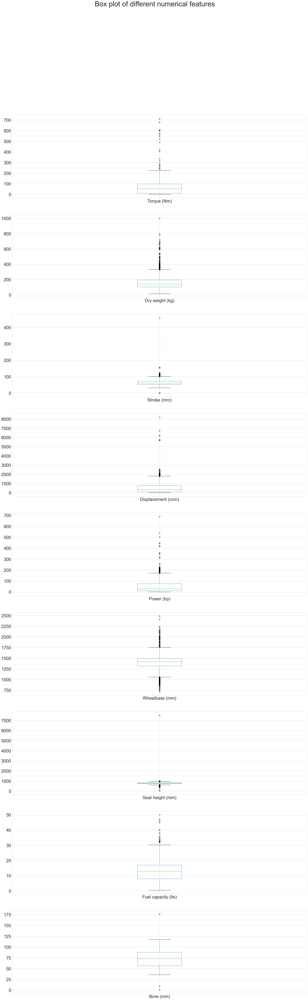

In [16]:
numerical_features = workdf.loc[:, list(features_name)].select_dtypes(include=[np.number])  # considering only features whose values are not categorical,
                                                                                            # draw a box plot

plt.figure(figsize=(30, 90))
plt.suptitle('Box plot of different numerical features', fontsize = 40)
plot_counter = 1
for column in numerical_features.columns:
    plt.subplot(len(numerical_features.columns),1,plot_counter)
    plot_counter+=1
    numerical_features.boxplot(column=column)
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)

The variances of different features can give us some insights about the diversity and spread of our data.
- Displacement (ccm): The large variance suggests a wide range of engine sizes among the motorcycles.
- Wheelbase (mm): The high variance implies motorcycles with varied sizes and lengths.
- Seat height (mm): The considerable variance indicates diverse seat heights, suiting riders of different sizes.
- Dry weight (kg): The substantial variance implies a broad range in motorcycle weight, from light to heavy.
- Torque (Nm) and Power (hp): High variances show motorcycles with a wide spectrum of power and torque values.
- Bore (mm), Stroke (mm) and Fuel capacity (lts): Smaller variances suggest these features are more standardized across motorcycles.

NOTE: we are only able to analyze the variance for numerical features as it's mathematically impossible to calculate the variance on categorical features.

In [17]:
from statistics import mode

for column in numerical_features.columns:
    feature_values = numerical_features[column]
    mean = feature_values.mean()
    variance = feature_values.var()
    std_deviation = feature_values.std()
    median = feature_values.median()
    mode_value = mode(feature_values)
    print(f"Column: {column}")
    print(f"\tMean: {mean}")
    print(f"\tVariance: {variance} (Standard deviation: {std_deviation})")
    print(f"\tMode: {mode_value}")
    print(f"\tMedian: {median}")
    print()

Column: Torque (Nm)
	Mean: 63.11679851876788
	Variance: 4056.503259849803 (Standard deviation: 63.69068424699018)
	Mode: 60.0
	Median: 54.1

Column: Dry weight (kg)
	Mean: 161.2426592797784
	Variance: 7213.270866016372 (Standard deviation: 84.93097706971452)
	Mode: 110.0
	Median: 140.0

Column: Stroke (mm)
	Mean: 64.59754488112566
	Variance: 340.0976230478933 (Standard deviation: 18.441735901153486)
	Mode: 57.8
	Median: 61.2

Column: Displacement (ccm)
	Mean: 543.4662966851657
	Variance: 289775.67639493966 (Standard deviation: 538.3081611818083)
	Mode: 125.0
	Median: 354.0

Column: Power (hp)
	Mean: 50.48904317639401
	Variance: 2675.6845039992204 (Standard deviation: 51.72701909059926)
	Mode: 27.0
	Median: 29.4

Column: Wheelbase (mm)
	Mean: 1417.216593886463
	Variance: 29135.558279040208 (Standard deviation: 170.69141243495588)
	Mode: 1400.0
	Median: 1420.0

Column: Seat height (mm)
	Mean: 791.5507835171213
	Variance: 18036.922861877327 (Standard deviation: 134.30161153864583)
	Mode: 

### Analyzing the mean values

#### Categorical, string-like features
In this section we are analyzing the spread of the categorical features in a dataset.

In [18]:
categorical_features = workdf.loc[:, list(features_name)].select_dtypes(exclude=[np.number])    # considering only features whose values are categorical

counts = {}
for column in categorical_features.columns:  # Calculate the counts for each column
    counts[column] = categorical_features[column].value_counts(dropna=True)

th = 15
plt.figure(figsize=(30, 350))
plt.suptitle('Frequency of values for each categorical feature ', fontsize = 40)
plot_counter = 1
for column, count in counts.items():
    if len(count)>th:
        count_top_th = count.head(th)
        sum_remaining = count.iloc[th:].sum()
        count_top_th['Remaining'] = sum_remaining
        plt.subplot(len(categorical_features.columns),1,plot_counter)
        plot_counter+=1
        plt.bar(count_top_th.index, count_top_th.values)
        plt.xlabel('Values', fontsize = 25)
        plt.xticks(rotation=45)
        plt.yticks(fontsize = 15)
        plt.ylabel('Frequency', fontsize = 25)
        plt.title(f"Counts for {column}", fontsize = 25)
    else:
        plt.subplot(len(categorical_features.columns),1,plot_counter)
        plot_counter+=1
        plt.bar(count.index, count.values)
        plt.xlabel('Values', fontsize = 25)
        plt.xticks(rotation=45)
        plt.yticks(fontsize = 15)
        plt.ylabel('Frequency', fontsize = 25)
        plt.title(f"Counts for {column}", fontsize = 25)

### Cleaning the dataframe from missing values
This code segment finally handles and cleans the missing data in the `workdf` dataFrame.

First, thanks to our analysis we can identify the column "Torque (Nm)" and the rows with more than four null values for deletion, as they contain an excessive missing data that can compromise the dataset's data quality.
Subsequently we instantiate a KNN imputer is established for filling the null values in both numeric and categorical columns.
#### The KNN Imputer
The KNN imputer employs the k-nearest neighbours algorithm to substitute missing values, considering the `k` closest samples in the data to the data point with the missing value.
This imputing methodology is generally considered superior to the SimpleImputer with its most frequent or mean strategy as it takes into account the relationships between data points when imputing missing values while the SimpleImputer strategies simply fill missing values with a constant value for each column, which can introduce bias.

Considering the following subset of the data:

| Brand | Model | Year | Category | Rating | Displacement (ccm) | Power (hp) |
|-------|-------|------|----------|--------|--------------------|------------|
| Access | Shade Xtreme 850 DLX EPS | 2020 | ATV | - | 781.0 | 57.7 |
| Access | Xtreme Enduro 300 | 2021 | ATV | - | 280.0 | 18.8 |
| Access | Xtreme S 480 | 2021 | ATV | - | 449.0 | - |
| Access | Xtreme Supermoto 300 | 2021 | ATV | - | 280.0 | 18.8 |
| Ace | EXP-4 | 1923 | Sport | - | 1299.0 | - |
| Ace | Standard | 1924 | Allround | - | 1234.0 | - |
| Ace | Standard | 1925 | Allround | - | 1234.0 | - |
| Ace | Standard | 1926 | Allround | - | 1234.0 | - |
| Ace | Standard Model | 1927 | Allround | - | 1234.0 | - |
| Adiva | AD 125 | 2009 | Scooter | 2.8 | 124.0 | 14.8 |
| Adiva | AD 125 | 2011 | Scooter | 2.9 | 124.0 | 13.0 |
| Adiva | AD 125LE | 2010 | Scooter | 1.9 | 124.0 | 13.0 |
| Adiva | AD 200 | 2011 | Scooter | 3.4 | 171.2 | 15.8 |

In this subset, the Ace EXP-4 model from 1923 in the Sport category lacks a power value. If we were to use a Simple Imputer, the missing value would be filled based on all motorcycles in the dataset, regardless of their brand, model, or category, the imputed value would be influenced by a broad range of motorcycles that may not be similar to the Ace EXP-4.

In our approach the KNN Imputer consider only the 3 closest motorcycles when imputing its missing power value. This approach is more likely to provide a meaningful and accurate imputation, as it takes into account the local structure and relationships within the data. The missing power value will be imputed at 18.8 instead of 53 with the mean value, which in this case is historically correct.

The KNN imputer is directly applicable on numerical columns while, to do the same on categorical columns, we must first transform them into ordinal values prior to KNN imputation to then revert them after the imputation.

In [19]:
def fill_missing_values_with_sampling(df, column_name):
    column = df[column_name]

    # Calculate probability distribution from available data
    available_data_column = column.dropna()  # Remove missing values
    probability_distribution = available_data_column.value_counts(normalize=True)

    # Generate random samples from the probability distribution
    num_missing_values = column.isnull().sum()
    fill_samples = np.random.choice(probability_distribution.index, size=num_missing_values, p=probability_distribution.values)
    # Replace missing values with generated samples
    column_filled = column.copy()
    column_filled[column_filled.isnull()] = fill_samples

    return column_filled

workdf_filledNullValues = workdf.copy()
for column in numerical_features.columns:  # fill missing values: only numerical features have missing values
    if numerical_features[column].isnull().any():
        workdf_filledNullValues[column] = fill_missing_values_with_sampling(numerical_features, column)

In [20]:
# just to try

print("Percentage of missing values by column.")
percs = (workdf_filledNullValues.isnull().mean() * 100).sort_values(ascending=False)
for c, p in percs.items():
    print(f"\t{c}: {p:.2f}%")

Percentage of missing values by column.
	Rating: 46.52%
	Model: 0.07%
	Brand: 0.00%
	Fuel control: 0.00%
	Front suspension: 0.00%
	Rear tire: 0.00%
	Front tire: 0.00%
	Fuel system: 0.00%
	Seat height (mm): 0.00%
	Wheelbase (mm): 0.00%
	Dry weight (kg): 0.00%
	Transmission type: 0.00%
	Cooling system: 0.00%
	Stroke (mm): 0.00%
	Fuel capacity (lts): 0.00%
	Bore (mm): 0.00%
	Gearbox: 0.00%
	Engine stroke: 0.00%
	Engine cylinder: 0.00%
	Torque (Nm): 0.00%
	Power (hp): 0.00%
	Displacement (ccm): 0.00%
	Category: 0.00%
	Year: 0.00%
	Rear suspension: 0.00%


In [21]:
display(workdf_filledNullValues)

,Brand,Model,Year,Category,Rating,Displacement (ccm),Power (hp),Torque (Nm),Engine cylinder,Engine stroke,...,Cooling system,Transmission type,Dry weight (kg),Wheelbase (mm),Seat height (mm),Fuel system,Front tire,Rear tire,Front suspension,Rear suspension
1,acabion,gtbo 55,2007,Sport,2.6,1300.0,541.0,420.0,In-line four,four-stroke,...,Liquid,Not Given/Unknown,360.0,1580.0,800.0,other,other,other,not given/unknown,not given/unknown
4,acabion,gtbo 70,2007,Prototype / concept model,3.1,1300.0,689.0,490.0,In-line four,four-stroke,...,Liquid,Not Given/Unknown,300.0,1499.0,710.0,other,other,other,not given/unknown,not given/unknown
6,access,ams 3.20 supercross,2016,ATV,NaN,280.0,18.8,12.0,Single cylinder,four-stroke,...,Air,Chain,225.0,1466.0,800.0,carburettor,other,other,not given/unknown,not given/unknown
7,access,ams 4.30 supermoto efi,2016,ATV,NaN,359.3,29.5,117.0,Single cylinder,four-stroke,...,Air,Chain,236.0,1520.0,762.0,efi. injection,other,other,not given/unknown,not given/unknown
8,access,ams 4.38 sm gear shift,2016,ATV,NaN,449.0,37.6,112.0,Single cylinder,four-stroke,...,Air,Chain,236.0,1120.0,775.0,carburettor,other,other,other,not given/unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38459,zündapp,roller super,1968,Scooter,NaN,49.0,18.0,64.0,Single cylinder,two-stroke,...,Air,Not Given/Unknown,83.5,1440.0,770.0,carburettor. other,other,other,not given/unknown,not given/unknown
38462,zündapp,z 2 g,1923,Sport,NaN,211.0,2.8,120.0,Single cylinder,two-stroke,...,Air,Belt,73.0,1610.0,830.0,carburettor,other,other,other,other
38466,zündapp,z 22,1923,Sport,NaN,211.0,2.3,18.0,Single cylinder,two-stroke,...,Air,Belt,58.0,1695.0,820.0,carburettor,other,other,other,other
38468,zündapp,z 249,1923,Sport,NaN,249.0,2.8,108.0,Single cylinder,two-stroke,...,Air,Belt,76.0,1485.0,780.0,carburettor,other,other,other,other


## Exercise 2: Encoding of categorical data
In Exercise 2, contained in the subsequent code section, we are encoding the categorical data in our dataset to prepare it for Principal Component Analysis (PCA).

One-hot encoding is applied to each categorical column transforming each unique categorical value into a separate column, effectively expanding the dimensionality of our dataset. The presence of a particular category in the original data for a given row is indicated by a '1' in the corresponding new column, and '0' otherwise, essentially a binary true/false representation.

For the categorical columns such as "Fuel system" containing multiple feature labels separated by '. ', we separate and split them into their own column.

For each split label, a one-hot encoded dataframe is created and concatenated to our working dataframe, 'sub_workdb' then, the original categorical columns are dropped from 'sub_workdb' as they have been replaced by the one-hot encoded columns.
The resulting dataframe is a fully numerical representation of our original data.

In [22]:
# visualize categorical features with original encoding
display(workdf_filledNullValues.loc[:, list(categorical_features_name)])

,Front suspension,Gearbox,Rear suspension,Cooling system,Fuel system,Fuel control,Front tire,Transmission type,Engine stroke,Rear tire,Engine cylinder
1,not given/unknown,6-speed,not given/unknown,Liquid,other,Not Given/Unknown,other,Not Given/Unknown,four-stroke,other,In-line four
4,not given/unknown,6-speed,not given/unknown,Liquid,other,Not Given/Unknown,other,Not Given/Unknown,four-stroke,other,In-line four
6,not given/unknown,Automatic,not given/unknown,Air,carburettor,Overhead Valves (OHV),other,Chain,four-stroke,other,Single cylinder
7,not given/unknown,Automatic,not given/unknown,Air,efi. injection,Overhead Cams (OHC),other,Chain,four-stroke,other,Single cylinder
8,other,5-speed,not given/unknown,Air,carburettor,Overhead Cams (OHC),other,Chain,four-stroke,other,Single cylinder
...,...,...,...,...,...,...,...,...,...,...,...
38459,not given/unknown,Not Given/Unknown,not given/unknown,Air,carburettor. other,Not Given/Unknown,other,Not Given/Unknown,two-stroke,other,Single cylinder
38462,other,2-speed,other,Air,carburettor,Not Given/Unknown,other,Belt,two-stroke,other,Single cylinder
38466,other,Not Given/Unknown,other,Air,carburettor,Not Given/Unknown,other,Belt,two-stroke,other,Single cylinder
38468,other,3-speed,other,Air,carburettor,Not Given/Unknown,other,Belt,two-stroke,other,Single cylinder


In [23]:
Xworkdf = workdf_filledNullValues.loc[:, list(features_name)]  # features selected

separator = '. ' # Values containing the string '. ' have to be split, since it is used to separate a list of characteristics in a unique string

for column in categorical_features_name:
    split_columns_df = Xworkdf[column].str.split(separator, expand=True) # a dataframe with one column for each split is obtained

    for col in split_columns_df.columns: # for each column 'col' of the dataframe split_columns_df
        pref = f"{column}_{col}"
        one_hot_encoding_df = pd.get_dummies(split_columns_df[col], prefix=pref)  # a dataframe whose categorical values are encoded with 'one hot encoding' is created

        Xworkdf = pd.concat([Xworkdf, one_hot_encoding_df], axis=1)  # append the new dataframe to Xworkdf

    Xworkdf = Xworkdf.drop(column, axis=1)  # delete original column since it is redudant in the new dataframe

Xfeatures_name = set(Xworkdf.columns)
Xcategorical_features_name = set(Xworkdf.columns) - numerical_features_name

In [24]:
# visualize categorical features with one hot encoding
display(Xworkdf.loc[:, list(Xcategorical_features_name)])

,Engine cylinder_1_four,Fuel control_1_valv,Engine cylinder_0_No,Engine stroke_0_Electric,Fuel control_0_Membrane,Engine stroke_1_dis,Fuel control_1_Given/Unknown,Engine cylinder_0_Radial,Gearbox_0_3-spee,Front suspension_0_telescopi,...,Engine cylinder_1_six,Rear suspension_6_other,Gearbox_0_2-spee,Engine stroke_1_turbine,Engine cylinder_1_dis,Front tire_0_100/80-17,Engine stroke_0_Singl,Engine cylinder_0_V3,Fuel control_2_Cam,Rear suspension_4_oi
1,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38459,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
38462,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
38466,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
38468,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Exercise 3: Preprocessing and PCA
In this segment, we undertake data preprocessing and Principal Component Analysis (PCA) application. The objective is to diminish data dimensionality whilst conserving maximum variance.

Initially, we employ two distinct scaling techniques: StandardScaler and MinMaxScaler. StandardScaler standardises features by eliminating the mean and scaling to unit variance, whereas MinMaxScaler individually scales and translates each feature to ensure it lies within a specific range on the training set, for instance, between zero and one.

Subsequently, we contrast the variances of our original dataset, Xworkdf, with those of the scaled datasets, Xworkdf_std and Xworkdf_mm. Variance is a measure of the dispersion of values in a dataset from the mean. In the context of PCA, a higher variance could suggest a feature is more informative, but it might also reflect the measurement scale.

Next, we plot the cumulative explained variance for each dataset. This plot illustrates the proportion of the total variance encapsulated within the first N components. For instance, approximately 90% of the variance for Xworkdf_std and Xworkdf_mm is contained within the first ~40 components. This suggests that we can reduce our data to about 40 dimensions whilst retaining 90% of its variance.

Finally, we apply PCA to our datasets and plot the cumulative explained variance for each. This plot enables us to observe the retained variance as we increase the number of components. We note that the variance increases with the number of components and then plateaus. This plateau would be an optimal choice for the number of components to retain.

The key insight from this segment is that data preprocessing and PCA application enable us to reduce data dimensionality while preserving as much variance as possible. This is critical for subsequent analyses, as working with lower-dimensional data can enhance the efficiency and interpretability of our analyses.

In [25]:
standardScaler_instance = StandardScaler()

range = (0,1)
minMaxScaler_instance = MinMaxScaler(feature_range=range)

Xworkdf_std = pd.DataFrame(standardScaler_instance.fit_transform(Xworkdf), columns=Xworkdf.columns)
Xworkdf_mm = pd.DataFrame(minMaxScaler_instance.fit_transform(Xworkdf), columns=Xworkdf.columns)

In [26]:
print("Variance of multiple dataframes.")

variance_of_DataFrames = pd.DataFrame({
    'Xworkdf': Xworkdf.var(),
    'Xworkdf_std': Xworkdf_std.var(),
    'Xworkdf_mm': Xworkdf_mm.var()
})

level2 = list(Xworkdf)
level1 = ['numerical features'] * len(numerical_features_name) + ['categorical features'] * (len(level2) - len(numerical_features_name))
multi_index = pd.MultiIndex.from_arrays([level1, level2], names=['feature type', 'feature name'])
variance_of_DataFrames.index = multi_index
pd.set_option('display.max_rows', None)
display(variance_of_DataFrames)

Variance of multiple dataframes.


Xworkdf  \
feature type         feature name                                       
numerical features   Torque (Nm)                          3781.880282   
                     Dry weight (kg)                      7201.073795   
                     Stroke (mm)                           347.075204   
                     Displacement (ccm)                 288792.979685   
                     Power (hp)                           2709.284922   
                     Wheelbase (mm)                      29347.717589   
                     Seat height (mm)                    14197.369194   
                     Fuel capacity (lts)                    36.323386   
                     Bore (mm)                             352.528597   
categorical features Front suspension_0_no                   0.215302   
                     Front suspension_0_other                0.249472   
                     Front suspension_0_telescopi            0.102604   
                     Front suspension_0_telescopic           0.044686   
                     Front suspension_1_coi                  0.016398   
                     Front suspension_1_fork                 0.086873   
                     Front suspension_1_forks                0.019569   
                     Front suspension_1_given/unknown        0.215302   
                     Front suspension_2_other                0.000146   
                     Front suspension_2_spring               0.016398   
                     Front suspension_3_oi                   0.016398   
                     Front suspension_4_damped               0.016398   
                     Front suspension_5_other                0.000073   
                     Gearbox_0_1-speed                       0.007117   
                     Gearbox_0_10-speed                      0.000219   
                     Gearbox_0_100-speed                     0.000585   
                     Gearbox_0_2-spee                        0.000073   
                     Gearbox_0_2-speed                       0.002335   
                     Gearbox_0_3-spee                        0.000073   
                     Gearbox_0_3-speed                       0.011280   
                     Gearbox_0_4-spee                        0.001388   
                     Gearbox_0_4-speed                       0.069102   
                     Gearbox_0_5-spee                        0.000146   
                     Gearbox_0_5-speed                       0.203670   
                     Gearbox_0_6-speed                       0.214424   
                     Gearbox_0_7-speed                       0.000950   
                     Gearbox_0_Automatic                     0.138761   
                     Gearbox_0_No                            0.119289   
                     Gearbox_1_Given/Unknown                 0.119289   
                     Gearbox_1_automatic                     0.000146   
                     Gearbox_1_wit                           0.001534   
                     Gearbox_2_reverse                       0.001534   
                     Rear suspension_0_dua                   0.012066   
                     Rear suspension_0_lin                   0.014556   
                     Rear suspension_0_monoshock             0.020901   
                     Rear suspension_0_no                    0.219679   
                     Rear suspension_0_other                 0.245680   
                     Rear suspension_0_singl                 0.013846   
                     Rear suspension_0_swin                  0.029433   
                     Rear suspension_0_twi                   0.015337   
                     Rear suspension_1_arm                   0.029433   
                     Rear suspension_1_given/unknown         0.219679   
                     Rear suspension_1_other                 0.000073   
                     Rear suspension_1_shock                 0.013846   
                     Rear suspension_1_shocks  

The variance in the scaled datasets, Xworkdf_std and Xworkdf_mm, looks very different from the variance in the original dataset, Xworkdf, especially for non-categorical features.

The StandardScaler scales features to have mean=0 and variance=1. Thus, the variance of all features in Xworkdf_std should be 1 or very close to it.

The MinMaxScaler, on the other hand, doesn't guarantee a specific variance; it merely shrinks or stretches the feature values into a designated range (0–1 in this case).

We can't infer much about the relative importance or relevance of features based on their variance in the scaled data. For that, we would need to look at the variance in the original dataset, Xworkdf. A higher variance in Xworkdf might indicate that a feature has a wider range of values and potentially contains more information, but could also simply reflect the scale of measurement.

### Applying the PCA
In this phase, we apply Principal Component Analysis on our preprocessed dataset, scaled via StandardScaler and MinMaxScaler to then fit the PCA on the datasets and plot in a single graph the cumulative explained variance, which indicates the variance captured by each principal component. This plot will aid us in determining the number of components to retain.

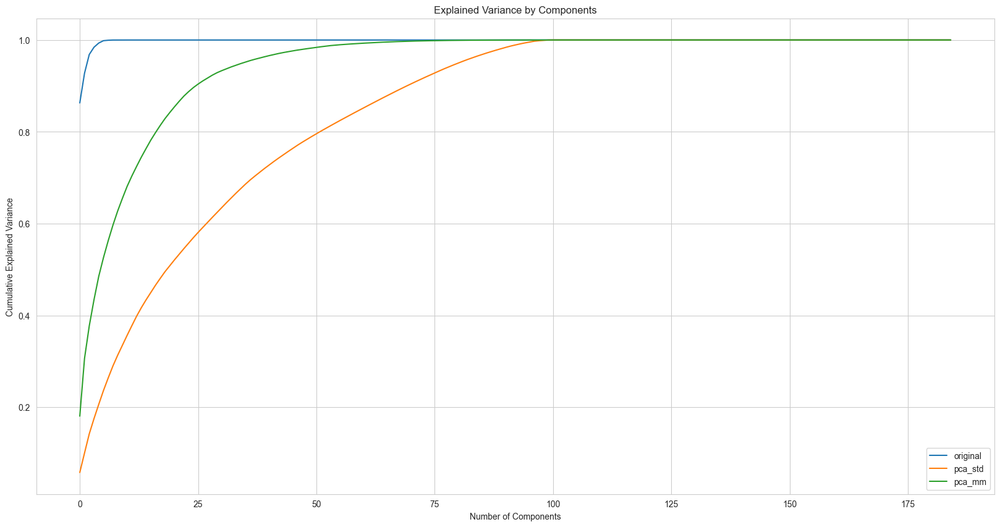

In [27]:
pca_instances = {
    'original': PCA(),
    'pca_std': PCA(),
    'pca_mm': PCA()
}

dataFrames = {
    'original': Xworkdf,
    'pca_std': Xworkdf_std,
    'pca_mm': Xworkdf_mm
}

for k in pca_instances.keys():
    pca_instances[k].fit(dataFrames[k])

# Plotting cumulative explained variance
plt.figure(figsize=(20, 10))

for k in pca_instances.keys():
    plt.plot(np.cumsum(pca_instances[k].explained_variance_ratio_), label=k)

plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Components')
plt.legend()
plt.show()

Upon examining this plot, we can deduce the proportion of the total 153-dimensional variance encapsulated within the first N components. Notably, the variance captured by Xworkdf_std and Xworkdf_mm differs significantly. Xworkdf_std requires approximately 60 principal components to capture 90% of its variance, whereas Xworkdf_mm achieves the same with around 30 components. This suggests that a reduction to approximately 40 dimensions for Xworkdf_mm could still preserve 90% of the original variance, striking a balance between data dimensionality and retained information.

As we can see the unscaled 'Xworkdf' dataset shows a significantly lower number of principal components. This is because PCA is sensitive to the variances of the feature scales. As 'Xworkdf' is not scaled, features with high variances dominate the principal components therefore leading to a less balanced representation of the original features. This highlights the importance of feature scaling prior to PCA for obtaining a more representative set of principal components.

# Exercise 4: Dimensionality Reduction and Interpretation of the PCs

In the following code sections, we will reduce the dimensionality of our dataset with PCA while trying to preserve the majority of the original variance.

Initially, we determine the number of principal components (PCs) needed to explain a given proportion of the total variance. This is achieved by accumulating the explained variance ratio until the threshold is met.

Subsequently, we identify the most influential features in each PC by examining their absolute weights. The features with the highest weights are deemed to have the most impact on the PC.

Next, we compute the PCA scores for our dataset, which represent our data projected onto the PCs. These scores are used for visualisation in either a 2D or 3D scatter plot, colour-coded by categories from the original dataset. This visualisation aids in understanding the data distribution in the reduced dimensional space.

This process is repeated for both the StandardScaler and MinMaxScaler transformed datasets, allowing us to understand how scaling impacts the PCA and the interpretation of the PCs.

## Determining the minimum number of principal components
In this code, we are determining the minimum number of principal components required to explain at least 35% of the total variance in two datasets, one standardized and one MinMax scaled. We then select the least of this number and 5, to limit the number of components to a maximum of 5 for easier visualisation and interpretation.

In [39]:
keys_to_be_considered = ['pca_std', 'pca_mm']  # for this part, only the corresponding dataframes has to be considered

In [40]:
def min_PCs(explained_variance_ratio, threshold):
    """
    Calculates the minimum number of principal components needed to explain a given threshold proportion of the total variance.

    Parameters:
    - explained_variance_ratio (list or array-like): A list or array containing the explained variance ratio for each principal component.
    - threshold (float): The threshold proportion of the total variance to be explained, expressed as a percentage.

    Returns:
    - int: The minimum number of principal components required to explain the specified threshold proportion of the total variance.
           Returns -1 if an error occurs.

    Example usage:
    >>> explained_variances = [0.3, 0.2, 0.15, 0.1, 0.1, 0.05, 0.04, 0.03, 0.02, 0.01]
    >>> threshold = 80
    >>> min_components = min_PCs(explained_variances, threshold)
    >>> print(min_components)
    6
    """

    threshold /= 100  # Convert threshold from percentage to ratio
    cumulative_explained_variance_ratio = 0

    for i, val in enumerate(explained_variance_ratio):
        cumulative_explained_variance_ratio += val  # Calculate cumulative explained variance ratio up to i
        if cumulative_explained_variance_ratio >= threshold:  # Check if cumulative explained variance ratio is greater than or equal to the threshold
            return i + 1  # Return the number of components needed to explain the threshold proportion of the total variance

    return -1  # Return -1 if an error occurs


In [41]:
max_comp = 5
min_number_components = {}
for k in keys_to_be_considered:
    min_number_components[k] = min_PCs(pca_instances[k].explained_variance_ratio_, 35) # Number of components needed to explain at least 35% of the total variance.

m = {}
for k in keys_to_be_considered:
    m[k] = min(min_number_components[k], max_comp)  # limit the number of components to a maximum fixed value

for k in keys_to_be_considered:
    print(f"{k}.")
    print(f"\tm = {m[k]} (min between {max_comp} and {min_number_components[k]}, number of components needed to explain at least 35% of the total variance.)")

pca_std.
	m = 5 (min between 5 and 11, number of components needed to explain at least 35% of the total variance.)
pca_mm.
	m = 3 (min between 5 and 3, number of components needed to explain at least 35% of the total variance.)


We note that for the standardized data (Xworkdf_std), 13 components are needed to explain at least 35% of the total variance, but only the first 5 are selected due to the imposed limit.
For the MinMax scaled data (Xworkdf_mm), we need only 4 to fulfil the task therefore and all 4 are selected.

This suggests that the MinMax scaled data is less complex or easier to work with than the standardized data, as fewer components are needed to explain the same proportion of the total variance.

barplots of percentage of explained variance, with respect to the PCs

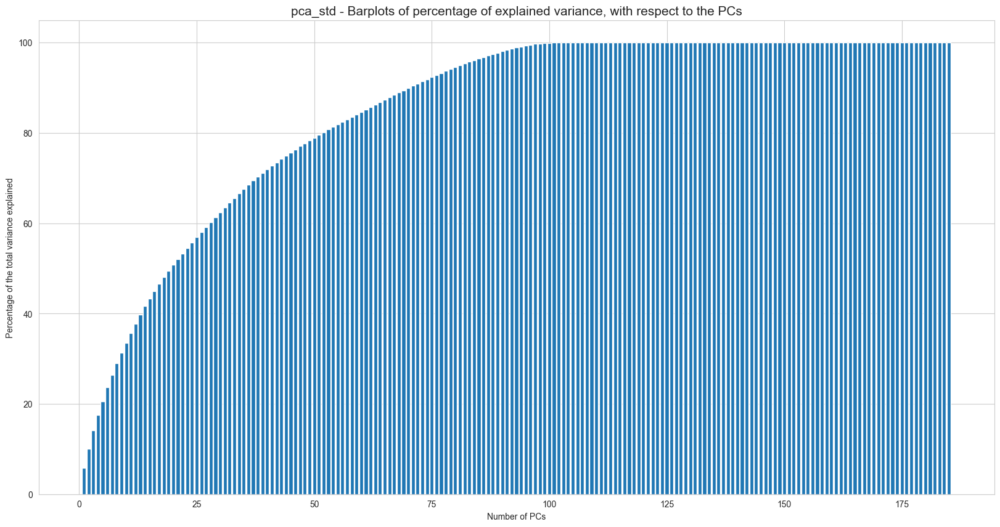

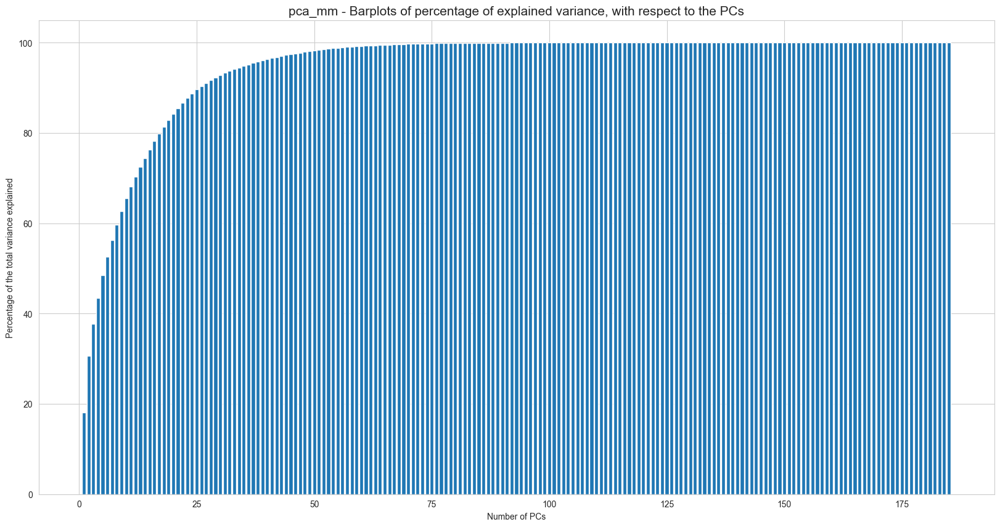

In [53]:
for k in keys_to_be_considered:
    # Plotting barplots of percentage of explained variance, with respect to the PCs
    plt.figure(figsize=(20, 10))
    plt.bar((np.arange(len(pca_instances[k].explained_variance_ratio_))+1), 100*np.cumsum(pca_instances[k].explained_variance_ratio_))

    plt.xlabel('Number of PCs')
    plt.ylabel('Percentage of the total variance explained')
    plt.title(k + ' - Barplots of percentage of explained variance, with respect to the PCs', fontsize = 15)

## Identifying the top features
In the following snippet, we are identifying the top features that contribute most to each of the first few principal components for the two datasets. The features are ranked based on the absolute values of their weights in the PCs, with the top features having the highest weights, thus providing insight into which original variables are driving the separation in the data observed in the PCs.

In [81]:
top_features_number =  5  # number of features with the highest absolute weight in a PC

for k in keys_to_be_considered:  # for each dataframe
    top_features_df = pd.DataFrame()
    i = 0 # 1st PC
    while i < (m[k]): # for each PC among the first m Pcs
        p = pca_instances[k].components_[i]  # weights in the PC
        feat_names = dataFrames[k].columns # corresponding feature (i.e., name)
        top_features = sorted([(w, n) for w, n in zip(p, feat_names)], key=lambda tup: -abs(tup[0]))[:top_features_number] # top features with the highest absolute weights

        # store information in a DataFrame for visualization purposes
        for count, f in enumerate(top_features):
            level1 = [f"PC{i+1}"]
            level2 = [count+1]
            multi_index = pd.MultiIndex.from_arrays([level1, level2], names=['PC', 'rank'])
            top_features_df = pd.concat([top_features_df, pd.DataFrame({"Name": [f[1]], "Weight": [f[0]]}, multi_index)])

        i+=1 # next PC

    extern_level_columns = pd.MultiIndex.from_tuples([('Feature', 'Name'), ('Feature', 'Weight')])
    top_features_df.columns = extern_level_columns

    print("Number of features with the highest absolute weight in a PC" + " - " + k)
    display(top_features_df)

Number of features with the highest absolute weight in a PC - pca_std


Feature          
                                      Name    Weight
PC  rank                                            
PC1 1               Fuel control_1_Overhea  0.208079
    2                 Fuel control_0_Doubl  0.206026
    3                    Fuel control_3_Ca  0.206026
    4              Fuel control_2_Cams/Twi  0.206026
    5                Fuel control_4_(DOHC)  0.206026
PC2 1                 Rear suspension_0_no  0.267048
    2      Rear suspension_1_given/unknown  0.267048
    3     Front suspension_1_given/unknown  0.265775
    4                Front suspension_0_no  0.265775
    5              Rear suspension_0_other -0.217187
PC3 1                Rear suspension_0_lin  0.278207
    2               Rear suspension_1_type  0.278207
    3                Rear suspension_2_coi  0.278207
    4             Rear suspension_3_spring  0.278207
    5                 Rear suspension_4_oi  0.278207
PC4 1                Engine stroke_0_Squar  0.377072
    2             Engine stroke_2_cylinder  0.377072
    3           Engine cylinder_2_cylinder  0.377072
    4                  Engine stroke_1_fou  0.377072
    5              Engine cylinder_0_Squar  0.377072
PC5 1                Engine cylinder_1_dis  0.389442
    2             Engine cylinder_2_Wankel  0.389442
    3                  Engine stroke_1_dis  0.389442
    4               Engine stroke_2_Wankel  0.389442
    5                  Engine stroke_0_Dua  0.342129

Number of features with the highest absolute weight in a PC - pca_mm


Feature          
                                      Name    Weight
PC  rank                                            
PC1 1                 Rear suspension_0_no  0.270295
    2      Rear suspension_1_given/unknown  0.270295
    3                Front suspension_0_no  0.264316
    4     Front suspension_1_given/unknown  0.264316
    5              Rear suspension_0_other -0.257852
PC2 1           Engine cylinder_1_cylinder -0.294301
    2              Engine cylinder_0_Singl -0.294218
    3            Fuel system_0_carburettor -0.246057
    4                Front suspension_0_no  0.215913
    5     Front suspension_1_given/unknown  0.215913
PC3 1                    Fuel control_0_No -0.315990
    2         Fuel control_1_Given/Unknown -0.315990
    3                 Fuel control_0_Singl  0.258138
    4                   Fuel control_2_Cam  0.258138
    5                Fuel control_3_(SOHC)  0.258138

## Applying Principal Component Analysis
In the following section, we are applying PCA to the standardized and MinMax scaled datasets to then the scores for the first 'm' principal components (PCs). We generate 3D scatter plots to visualize the scores of the first three PCs, with points coloured according to their category, and compute the explained variance ratio and cumulative explained variance for each dataset to assess the effectiveness of the PCA transformation.

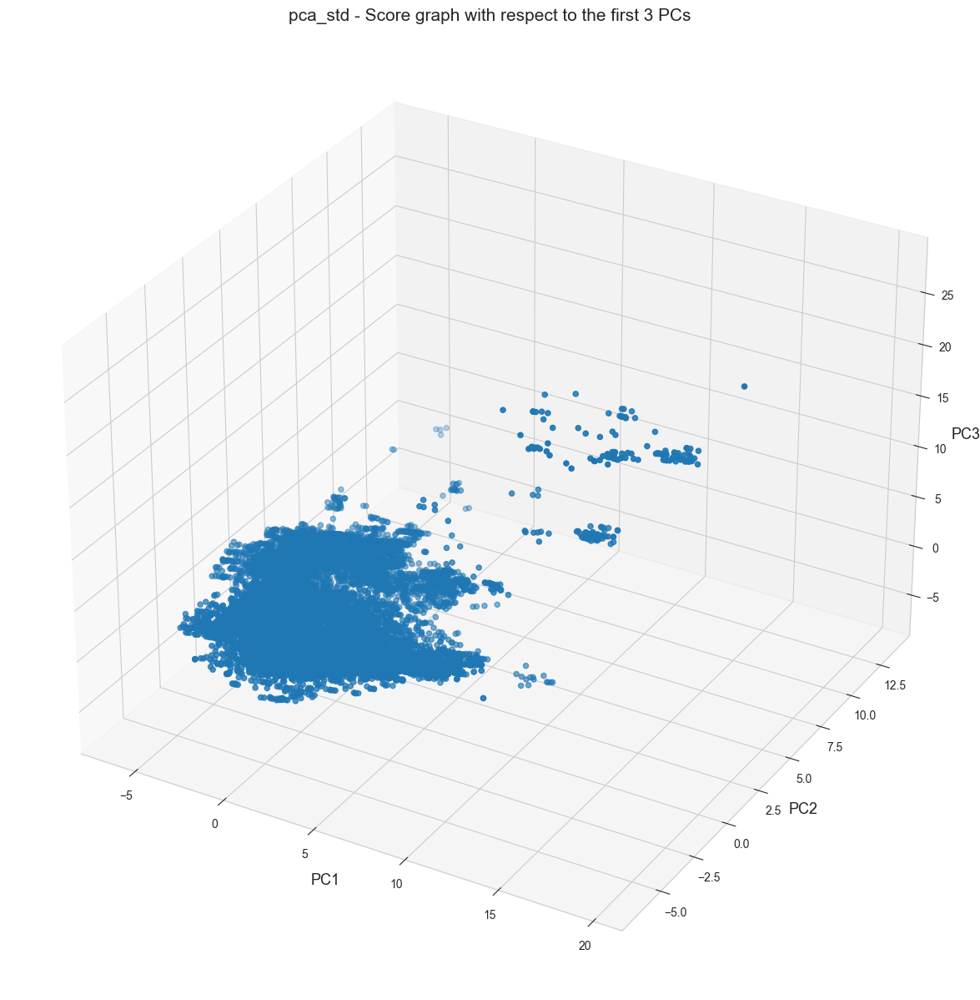

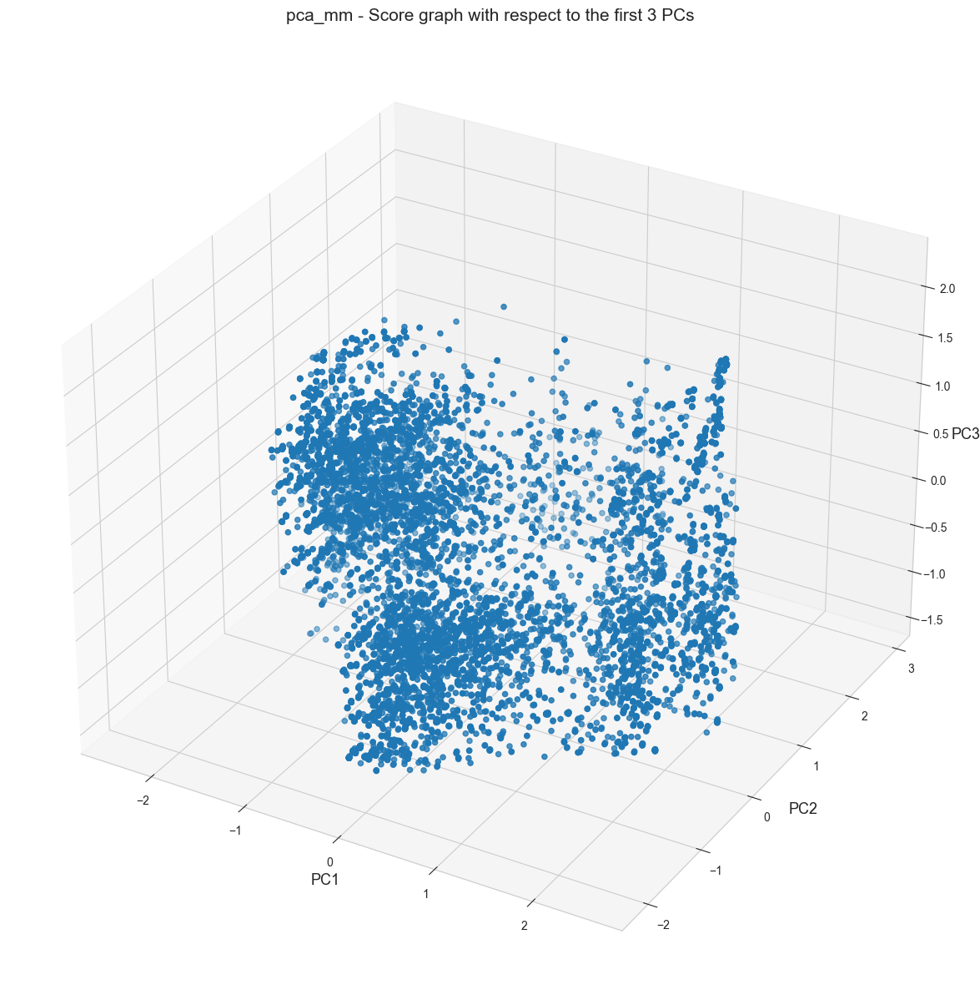

In [87]:
for k in keys_to_be_considered:
    df_transformed = pca_instances[k].transform(dataFrames[k])  # apply PCA transformation
    scores = df_transformed[:, :m[k]]  # compute scores for the first m PCs

    # score graph with respect to the first l PCs
    if m[k] == 2:
        l = 2
        plt.figure(figsize=(20, 18))
        plt.scatter(scores[:, 0], scores[:, 1])
        plt.xlabel("PC1", fontsize=13)  # PC1 on axis x
        plt.ylabel("PC2", fontsize=13)  # PC2 on axis y
        plt.title(f'{k} - Score graph with respect to the first {l} PCs', fontsize=15)
    else:
        l = 3
        fig = plt.figure(figsize=(20, 15))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(scores[:, 0], scores[:, 1], scores[:, 2])
        ax.set_xlabel("PC1", fontsize=13)  # PC1 on axis x
        ax.set_ylabel("PC2", fontsize=13)  # PC2 on axis y
        ax.set_zlabel("PC3", fontsize=13)  # PC3 on axis z
        plt.title(f'{k} - Score graph with respect to the first {l} PCs', fontsize=15)

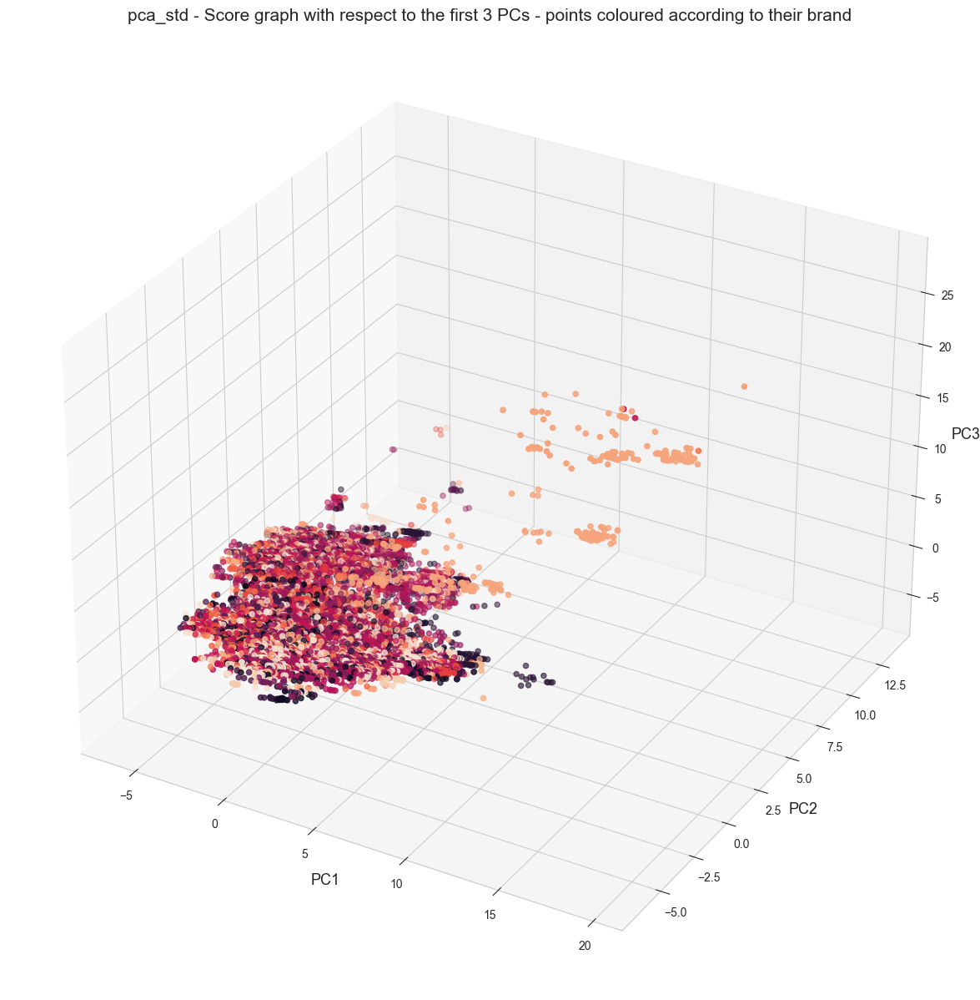

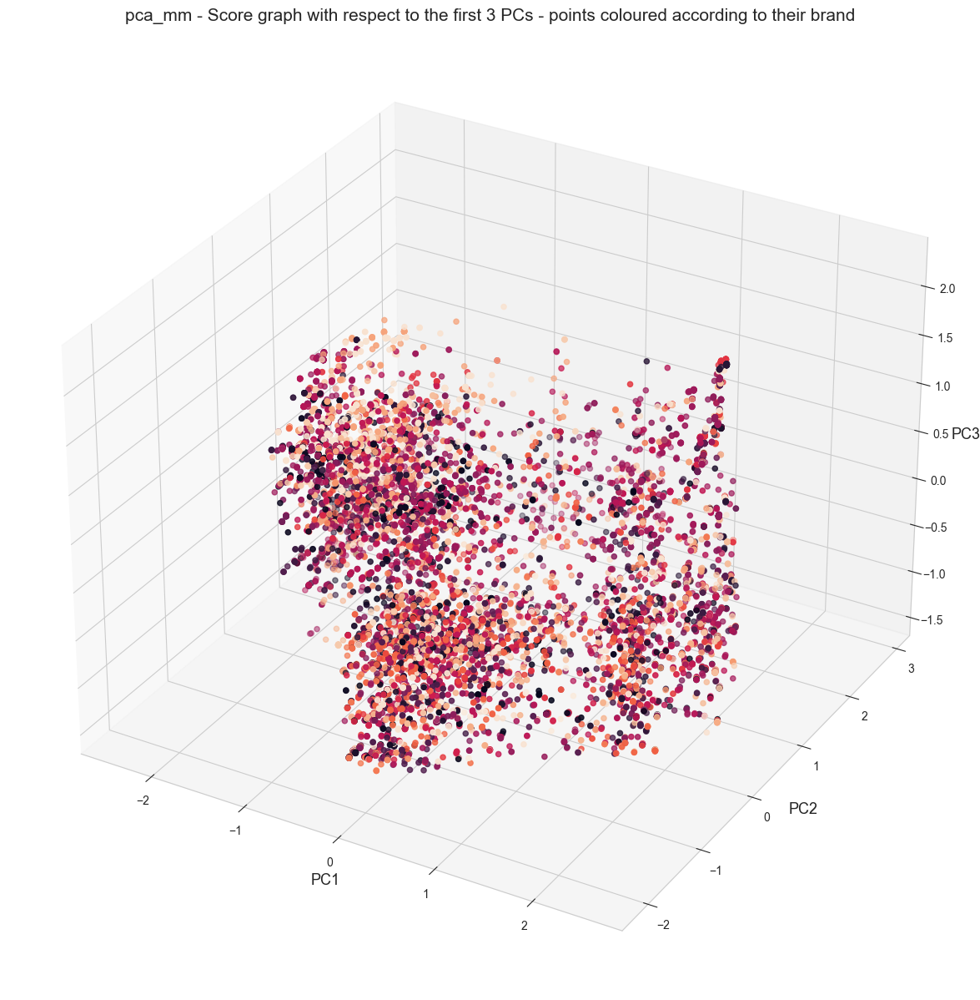

In [96]:
label = pd.factorize(workdf['Brand'])[0]  # encode 'Brand' column with numbers to color points according to brand

for k in keys_to_be_considered:
    df_transformed = pca_instances[k].transform(dataFrames[k])  # apply PCA transformation
    scores = df_transformed[:, :m[k]]  # compute scores for the first m PCs

    # score graph with respect to the first l PCs - points coloured according to their brand
    if m[k] == 2:
        l = 2
        plt.figure(figsize=(20, 18))
        plt.scatter(scores[:, 0], scores[:, 1], c = label)
        plt.xlabel("PC1", fontsize=13)  # PC1 on axis x
        plt.ylabel("PC2", fontsize=13)  # PC2 on axis y
        plt.title(f'{k} - Score graph with respect to the first {l} PCs - points coloured according to their brand', fontsize=15)
    else:
        l = 3
        fig = plt.figure(figsize=(20, 15))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(scores[:, 0], scores[:, 1], scores[:, 2], c = label)
        ax.set_xlabel("PC1", fontsize=13)  # PC1 on axis x
        ax.set_ylabel("PC2", fontsize=13)  # PC2 on axis y
        ax.set_zlabel("PC3", fontsize=13)  # PC3 on axis z
        plt.title(f'{k} - Score graph with respect to the first {l} PCs - points coloured according to their brand', fontsize=15)

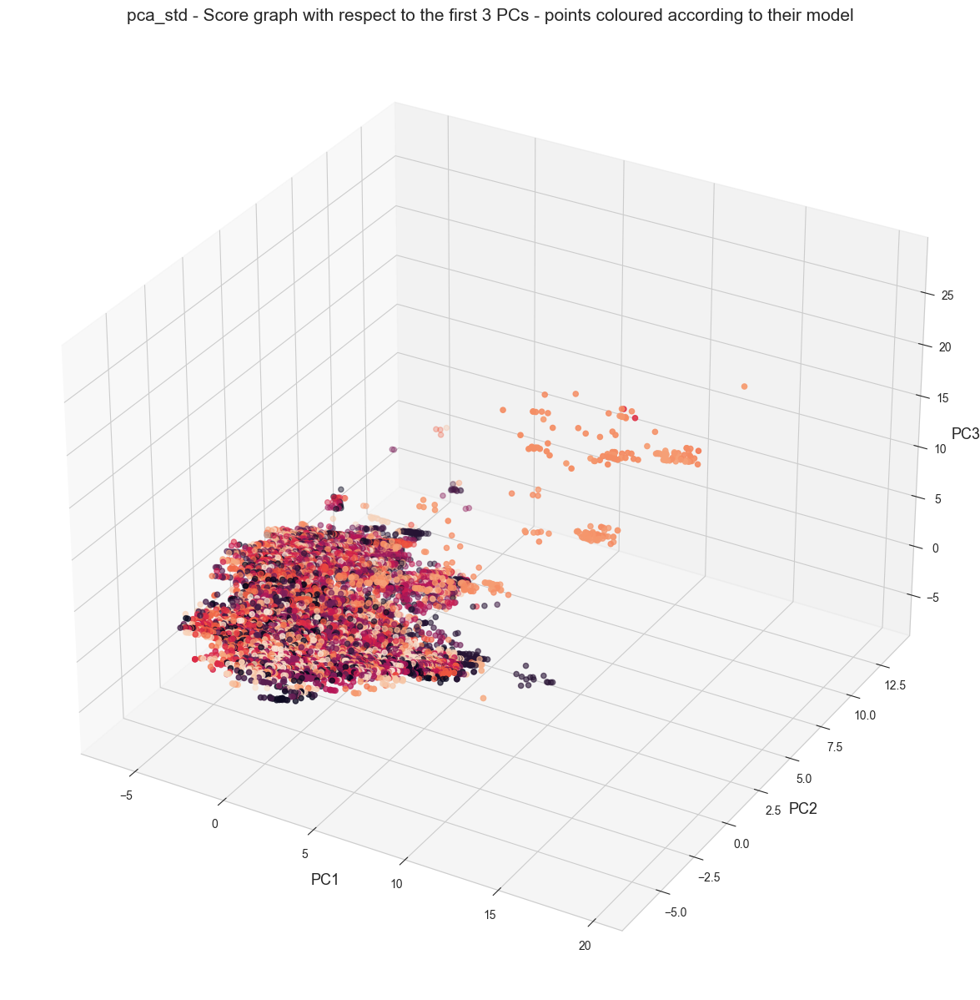

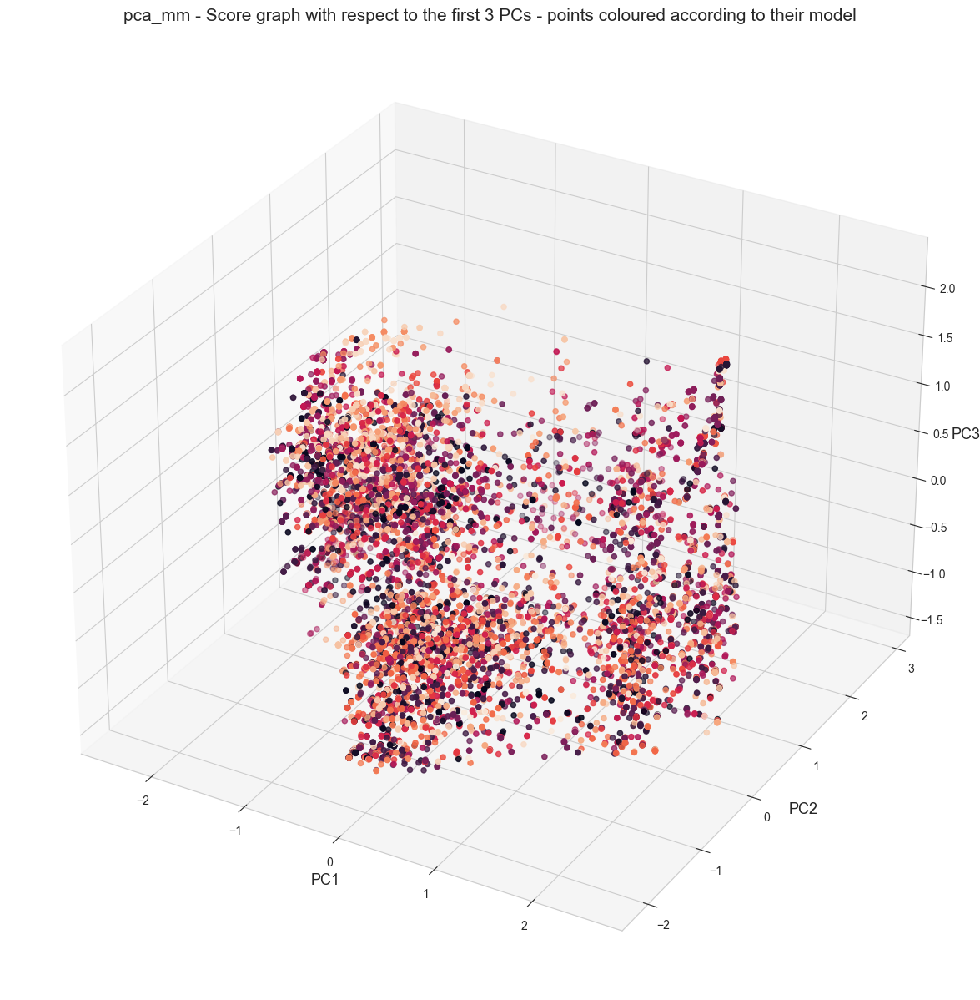

In [97]:
label = pd.factorize(workdf['Model'])[0]  # encode 'Model' column with numbers to color points according to model

for k in keys_to_be_considered:
    df_transformed = pca_instances[k].transform(dataFrames[k])  # apply PCA transformation
    scores = df_transformed[:, :m[k]]  # compute scores for the first m PCs

    # score graph with respect to the first l PCs - points coloured according to their model
    if m[k] == 2:
        l = 2
        plt.figure(figsize=(20, 18))
        plt.scatter(scores[:, 0], scores[:, 1], c = label)
        plt.xlabel("PC1", fontsize=13)  # PC1 on axis x
        plt.ylabel("PC2", fontsize=13)  # PC2 on axis y
        plt.title(f'{k} - Score graph with respect to the first {l} PCs - points coloured according to their model', fontsize=15)
    else:
        l = 3
        fig = plt.figure(figsize=(20, 15))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(scores[:, 0], scores[:, 1], scores[:, 2], c = label)
        ax.set_xlabel("PC1", fontsize=13)  # PC1 on axis x
        ax.set_ylabel("PC2", fontsize=13)  # PC2 on axis y
        ax.set_zlabel("PC3", fontsize=13)  # PC3 on axis z
        plt.title(f'{k} - Score graph with respect to the first {l} PCs - points coloured according to their model', fontsize=15)

In [98]:
for k in keys_to_be_considered:
    if m[k] == 2:
        l = 2
    else:
        l = 3

    explained_variance_ratio =  pca_instances[k].explained_variance_ratio_[:l]
    print(f"{k} - Explained variance ratio of the first l = {l}", explained_variance_ratio)
    explained_variance_ratio__mean_cum = np.cumsum(explained_variance_ratio).mean()
    print(f"{k} - Mean cumulative explained variance", explained_variance_ratio__mean_cum)

pca_std - Explained variance ratio of the first l = 3 [0.05792293 0.04242573 0.04163324]
pca_std - Mean cumulative explained variance 0.1000844985288541
pca_mm - Explained variance ratio of the first l = 3 [0.18063028 0.12578278 0.07067566]
pca_mm - Mean cumulative explained variance 0.28804401592474677


In these graphs, we are representing the scores of the first three principal components (PCs) of the datasets. The scores are the coordinates of each data point in the space defined by the PCs and each point in the scatter plot corresponds to a row in the dataset where its position is determined by its scores on the PCs. The points are coloured according to their 'Category' value, allowing us to investigate the presence of patterns or groups of categories in the PC space.

The explained variance ratio for the first three PCs indicates the proportion of total variance each PC accounts for. In the standardized data, these PCs explain approximately 5.7%, 3.9%, and 3.2% of the variance. In contrast, the MinMax scaled data's first three PCs account for approximately 15.4%, 9.1%, and 7.7% of the variance, suggesting a more effective representation.

On the other hand, the cumulative explained variance (mean of), represents the mean proportion of total variance explained by all PCs up to a given point> We can note it is higher in the MinMax scaled data (approximately 95%) compared to the standardized data (approximately 88%). This confirms us that MinMax scaling method is more effective in preserving variance in the PCA transformation.

The code creates the score graphs for the first PCs, where = 2 if m = 2 and m = 3 if m ≥ 3. This is done by creating 3D scatter plots and using the scores of the first m PCs as the coordinates of the points.

# Exercise 5 and 6: k-Means and Clusters and Centroid Interpretation and Visualization

In the following code sections, regarding exercises 5 and 6, we employ the k-Means clustering algorithm to identify meaningful clusters within our data, which has been reduced to a manageable number of dimensions using PCA.

In exercise 5, we calculate silhouette scores for a range of potential cluster numbers (k) from 3 to 10. The silhouette score is a measure of how similar an object is to its own cluster compared to other clusters. A higher silhouette score indicates that the object is well-matched to its own cluster and poorly matched to neighbouring clusters. This is done for both the StandardScaler and MinMaxScaler transformed data, stored in `Xworkdf_std_pca_df` and `Xworkdf_mm_pca_df` respectively. The optimal number of clusters is determined as the one that maximises the silhouette score.

In exercise 6, we run the k-Means algorithm with the optimal number of clusters determined in exercise then to visualize them in a scatter plot, with each cluster represented by a different colour. The centroids of the clusters, which are the mean of the vectors of the objects in the cluster, are also plotted in blue. These centroids can be interpreted as the 'average' object in each cluster.

## Performing k-Means clustering on the two datasets
The following code performs k-Means clustering on two datasets transformed by PCA, it calculates the silhouette score for each k, identifies the optimal k that maximises the silhouette score, and fits the k-Means model with the optimal k.

In [100]:
kmeans = {}
silhouette_scores =  {}
k_best = {}
for key in keys_to_be_considered:
    df_transformed = pca_instances[key].transform(dataFrames[key])  # apply PCA transformation
    df_transformed = pd.DataFrame(df_transformed, columns=[f'PC{i+1}' for i in np.arange(df_transformed.shape[1])])  # corresponding dataFrame

    k_values = np.arange(3, 11) # values for k to be considered in the k-MEANS algorithm
    silhouette_scores[key] = []
    for k in k_values:
        kmeans[key] = KMeans(n_clusters=k, random_state=rs, n_init=10).fit(df_transformed) # Fit the k-Means model
        silhouette_scores[key].append(silhouette_score(df_transformed, kmeans[key].labels_)) # silhouette score computation

    k_best[key] = k_values[np.argmax(silhouette_scores[key])] # optimal number of clusters such that it maximises the silhouette score
    print(f"{key} - k opt = {k_best[key]}")

    # Run the algorithm with the optimal number of clusters
    kmeans[key] = KMeans(n_clusters=k_best[key], random_state=rs, n_init=10)
    kmeans[key].fit(df_transformed)

pca_std - k opt = 10
pca_mm - k opt = 4


In [101]:
df_transformed # ha tutte le features!

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC176,PC177,PC178,PC179,PC180,PC181,PC182,PC183,PC184,PC185
0,1.111257e+00,1.032089,-0.981807,0.607597,0.919706,-0.450398,-0.546025,0.013489,-0.337964,0.300983,...,-1.578531e-16,-3.572446e-17,-1.398621e-16,-3.220080e-17,-3.913970e-17,2.055647e-16,7.840950e-16,2.428613e-16,1.873501e-16,9.714451e-17
1,1.111030e+00,1.023299,-0.988621,0.599959,0.918686,-0.452505,-0.543071,0.011663,-0.336341,0.302747,...,-1.335669e-16,-5.654114e-17,-2.161899e-16,-8.077306e-17,-1.362842e-16,3.304648e-16,9.922618e-16,1.804112e-16,2.151057e-16,2.081668e-16
2,1.487772e+00,0.186539,0.851354,-0.667484,-1.127733,0.345807,-0.471225,-0.026516,-0.667820,0.834618,...,-7.003946e-17,9.877082e-17,6.938894e-17,5.182486e-17,1.366095e-16,1.873501e-16,-9.714451e-17,-5.551115e-17,-9.714451e-17,-7.632783e-17
3,1.424699e+00,0.389285,0.834563,-0.829629,-0.740308,0.194823,0.064966,-0.364895,-0.507000,1.129181,...,9.194034e-17,8.521829e-17,-1.734723e-17,9.324139e-18,6.938894e-18,1.387779e-17,-3.330669e-16,2.775558e-17,-5.551115e-17,-1.873501e-16
4,7.290018e-01,-0.224608,0.855361,-0.585979,-1.553670,0.095776,0.147212,0.108256,-0.373252,0.156507,...,4.987330e-17,4.531965e-17,-8.673617e-19,-7.589415e-18,-1.006140e-16,8.326673e-17,1.110223e-16,-1.665335e-16,1.526557e-16,-4.232725e-16
5,7.227634e-01,-0.214906,0.858375,-0.573340,-1.550442,0.089454,0.141321,0.108085,-0.377583,0.157833,...,2.905662e-17,6.266689e-17,4.076600e-17,1.322727e-17,-3.122502e-17,0.000000e+00,5.551115e-17,-2.081668e-16,1.665335e-16,-2.289835e-16
6,1.436611e+00,0.054657,0.775955,-1.049661,-0.886964,0.269069,-0.133178,-0.298509,-0.994487,0.927467,...,-4.965646e-17,2.286582e-16,2.376571e-16,1.307548e-16,9.540979e-17,9.714451e-17,-3.747003e-16,0.000000e+00,-2.775558e-17,-1.873501e-16
7,1.422324e+00,0.397868,0.838864,-0.822283,-0.739384,0.195277,0.062330,-0.364213,-0.508373,1.127876,...,7.806256e-17,9.562663e-17,-1.040834e-17,1.626303e-17,2.081668e-17,1.387779e-17,-3.053113e-16,4.163336e-17,-5.551115e-17,-2.151057e-16
8,1.798898e+00,0.773359,0.848078,-0.886638,-0.552796,0.060354,0.870154,-0.321615,-0.224595,0.984291,...,2.168404e-18,1.631724e-16,9.627715e-17,7.914676e-17,6.331741e-17,4.163336e-17,-3.330669e-16,9.714451e-17,5.551115e-17,-2.428613e-16
9,1.416836e+00,0.406573,0.843092,-0.811201,-0.738163,0.190191,0.059525,-0.363067,-0.512415,1.129108,...,7.806256e-17,9.562663e-17,-2.428613e-17,1.626303e-17,2.081668e-17,5.551115e-17,-3.330669e-16,8.326673e-17,4.163336e-17,-1.040834e-16


## Plotting the K-means clustered data on graphs

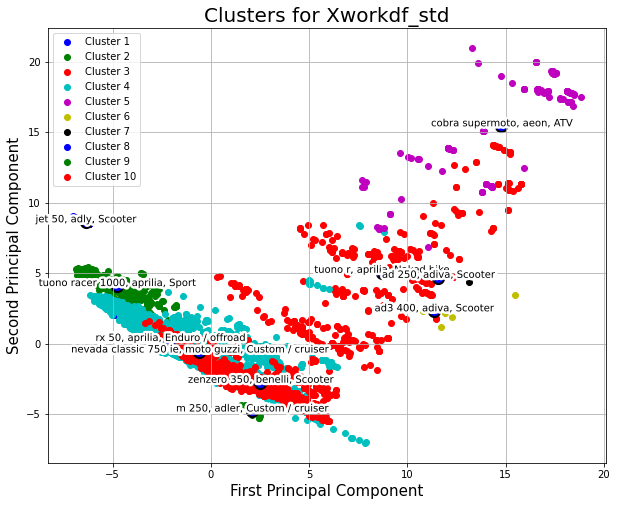

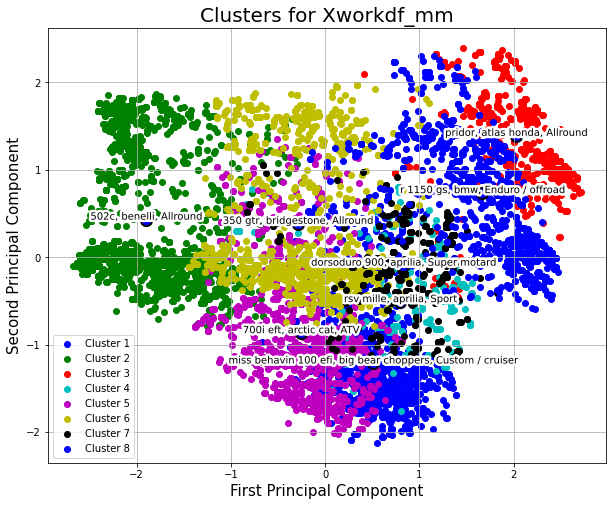

In [25]:
for key in keys_to_be_considered:
    plt.figure(figsize=(20, 15))
    plt.grid(True)
    plt.title(title, fontsize=20)
    plt.xlabel('First Principal Component', fontsize=15)
    plt.ylabel('Second Principal Component', fontsize=15)

    # Plot each cluster
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']
    for z in range(k):
        plt.scatter(X[kmeans.labels_ == z, 0], X[kmeans.labels_ == z, 1], c=colors[z % len(colors)],
                    label='Cluster ' + str(z + 1))

    # Plot the centroids of the clusters and assign the name and brand of the closest motorcycle
    for z in range(k):
        # Plot the centroid of the current cluster
        plt.scatter(kmeans.cluster_centers_[z, 0], kmeans.cluster_centers_[z, 1], s=500, c='blue', marker='.',
                    edgecolor='black', linewidths=2)

        # Calculate the Euclidean distance from each point in the current cluster to the centroid
        distances = np.linalg.norm(X[kmeans.labels_ == z] - kmeans.cluster_centers_[z], axis=1)

        # Find the index of the point in the current cluster that is closest to the centroid
        closest_motorcycle_index = np.argmin(distances)

        # Retrieve the name and brand of the motorcycle corresponding to the closest point
        closest_motorcycle_name = workdf.iloc[closest_motorcycle_index]['Model']
        closest_motorcycle_brand = workdf.iloc[closest_motorcycle_index]['Brand']
        closest_motorcycle_category = workdf.iloc[closest_motorcycle_index]['Category']

        # Display the name and brand of the closest motorcycle at the centroid of the cluster
        plt.text(kmeans.cluster_centers_[z, 0], kmeans.cluster_centers_[z, 1],
                 f'{closest_motorcycle_name}, {closest_motorcycle_brand}, {closest_motorcycle_category}', fontsize=10, ha='center', color='black',
                 path_effects=[pe.withStroke(linewidth=5, foreground='white')])

    plt.legend()
    plt.show()


# Plot the clusters for the StandardScaler and MinMaxScaler transformed data
plot_clusters(Xworkdf_std_pca_df.values, optimal_kmeans_std, k_optimal_std, 'Clusters for Xworkdf_std', workdf)
plot_clusters(Xworkdf_mm_pca_df.values, optimal_kmeans_mm, k_optimal_mm, 'Clusters for Xworkdf_mm', workdf)

In the two output graphs, each cluster represents a group of data points that share similar characteristics according to the features used for clustering. The points in the graph are the individual data instances, and their position is determined by the values of the first two principal components. The clusters found by the K-means algorithm are groups of points that are closer to each other than to points in other clusters, according to the Euclidean distance in the space of the first two principal components.

The number of clusters is not directly related to the minimum number of components computed before. The number of components was chosen to capture a certain proportion of the total variance in the data, while the number of clusters is chosen to maximize the silhouette score, which is a measure of how well each instance lies within its cluster compared to other clusters.

The centroids of the clusters, marked by blue dots, represent the "center" of each cluster, calculated as the mean of the feature vectors of all instances in the cluster.

In terms of interpretation, we note that Xworkdf_std, has 10 clusters far less spreaded than the 8 in Xworkdf_mm, this is because not only the silhouette score for Xworkdf_std was higher but takes us back to when we scaled the data.

# Exercise 7: Clusters and Centroids Evaluation
In Exercise 7, we are tasked with performing an internal and external evaluation of the clusters obtained from the k-Means algorithm applied to the principal components of the dataset.

In the following section, we will analyse and plot the distribution of the 'Engine stroke' label within each cluster. This involves adding the cluster labels to the dataframes and then adding back the original 'Engine stroke' data, after that we will visualise the distribution of 'Engine stroke' across clusters using count plots.

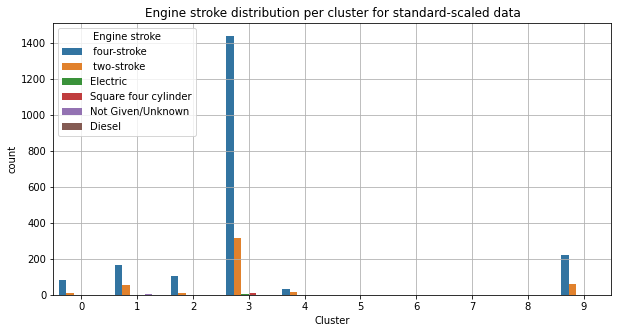

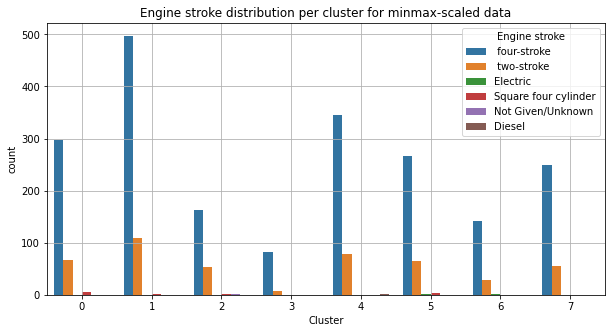

In [26]:
# Instantiate KMeans with the optimal number of clusters determined previously and fit it to the PCA-transformed data
kmeans_std = k_means_std.fit(Xworkdf_std_pca)
kmeans_mm = k_means_mm.fit(Xworkdf_mm_pca)

# Add the resulting cluster labels as a new column in the original dataframe
Xworkdf_std['Cluster'] = kmeans_std.labels_
Xworkdf_mm['Cluster'] = kmeans_mm.labels_

# Reintroduce the original "Engine stroke" data to the dataframes
Xworkdf_std['Engine stroke'] = workdf['Engine stroke']
Xworkdf_mm['Engine stroke'] = workdf['Engine stroke']

# Visualise the distribution of "Engine stroke" across the clusters
# This is done by creating a count plot for each cluster, with different "Engine stroke" values represented by different colours
plt.figure(figsize=(10, 5))
sns.countplot(x='Cluster', hue='Engine stroke', data=Xworkdf_std)
plt.title('Engine stroke distribution per cluster for standard-scaled data')
plt.grid()
plt.show()

# Repeat the process for the MinMax-scaled data
plt.figure(figsize=(10, 5))
sns.countplot(x='Cluster', hue='Engine stroke', data=Xworkdf_mm)
plt.title('Engine stroke distribution per cluster for minmax-scaled data')
plt.grid()
plt.show()


The graphs show how the 'Engine stroke' feature is spread across different clusters, for the standard-scaled data, most of the 'Engine stroke' information is in cluster 3, which has more than 1400 instances. This means that the motorcycles in this cluster are very similar in terms of their 'Engine stroke'.

On the other hand, for the MinMax-scaled data, the 'Engine stroke' information is more evenly spread across the clusters. Cluster 1 has the most instances with a little less than 500, followed by cluster 4 with nearly 350, and cluster 0 with around 300. This shows a more balanced spread of the 'Engine stroke' feature across the clusters.

# Conclusions
In conclusion, this project demonstrates the power of PCA and k-Means clustering in extracting meaningful insights from high-dimensional data. Through dimensionality reduction, we were able to visualize the structure of the bike dataset and identify inherent groupings. The clusters obtained provide a valuable understanding of the different types of motorcycles in our dataset.
